In [263]:
# Homework 5 (due 07/30/2024)
# Hannah Chipman (collaborated some with June Kim)

# SVM and Kernels

### Objective
Through this project, you will learn to use nonlinear kernels to improve a support vector classifier. The toy examples within this project aim to guide you as you build your intuition for the decision boundaries that can be generated via different kernels.

This project is structured as follows:
#### Part 1: Binary classification of synthetic data
1.1. Generate and explore synthetic data

1.2. SVM with nonlinear kernels
#### Part 2: US Flags
2.1. Load and explore flags data

2.2. SVMs for flag pixel data

2.3. Comparison to decision trees


In [264]:
# standard imports
import os, random
import numpy as np
import matplotlib.pyplot as plt

# sklearn imports
from sklearn.datasets import *
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.inspection import DecisionBoundaryDisplay

# you may need to install the PIL in your environment
# for installation in mamba environment type "mamba install pillow -c conda-forge" in your miniforge prompt
# for installation in conda environment type "conda install pillow -c conda-forge" in your conda prompt or anaconda prompt
# for installation via pip type "pip install pillow" in your terminal
from PIL import Image

## Part 1: Binary classification of synthetic data

### Part 1.1: Generate and explore synthetic data
The next cell defines the function `generate_dataset`, which you can use to generate synthetic (i.e., computer generated) data sets for binary classification. It includes eight different methods for data-set generation. 
1. Try out each method and visualize the resulting data set. For the 'swiss' and 'scurve' data sets, try out two different values of the keyword argument `splits`.
2. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a linear classifier.
3. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a nonlinear classifier.

In [265]:
# Function to convert an array of real numbers into an array of 0s and 1s
# Function to convert an array of real numbers into an array of 0s and 1s
def binarize(arr, split=10):
    # Calculate the decile thresholds
    percentiles = int(np.ceil(100/split))
    split_points = np.arange(0, 100+percentiles, percentiles)
    split_points[split_points>100] = 100
    deciles = np.percentile(arr, split_points)
    
    # Create a new array to hold the modified values
    modified_arr = np.zeros_like(arr)
    
    # Iterate through each decile range and set values accordingly
    for i in range(split):
        if i >= split-1:
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i])] = 1
                
        elif i % 2 == 0:
            # Set values in even deciles to 0
            modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 0
        else:
            # Set values in odd deciles to 1
            modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 1
    
    return modified_arr
# Function to generate datasets
def generate_dataset(dataset_type, n_samples=300, noise=0.1, split=10, random_state=0):
    if dataset_type == 'linearly_separable':
        X, y = make_classification(n_samples=n_samples, n_features=2, n_redundant=0, n_informative=2,
                                   random_state=random_state, n_clusters_per_class=1)
    elif dataset_type == 'blobs':
        X, y = make_blobs(n_samples=[n_samples//2, n_samples//2], random_state=random_state, cluster_std=noise)
    elif dataset_type == 'quantiles':
        X, y = make_gaussian_quantiles(n_samples=n_samples, n_classes=2, cov=noise, random_state=random_state)
    elif dataset_type == 'moons':
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    elif dataset_type == 'circles':
        X, y = make_circles(n_samples=n_samples, noise=noise, factor=0.5, random_state=random_state)
    elif dataset_type == 'unstructured':
        X, y = np.random.random(size=(n_samples, 2)), np.random.randint(0,2, size=(n_samples))
    elif dataset_type == 'swiss':
        X, y = make_swiss_roll(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    elif dataset_type == 'scurve':
        X, y = make_s_curve(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    else:
        raise ValueError("Invalid dataset type")
    
    X = StandardScaler().fit_transform(X)
    return X, y

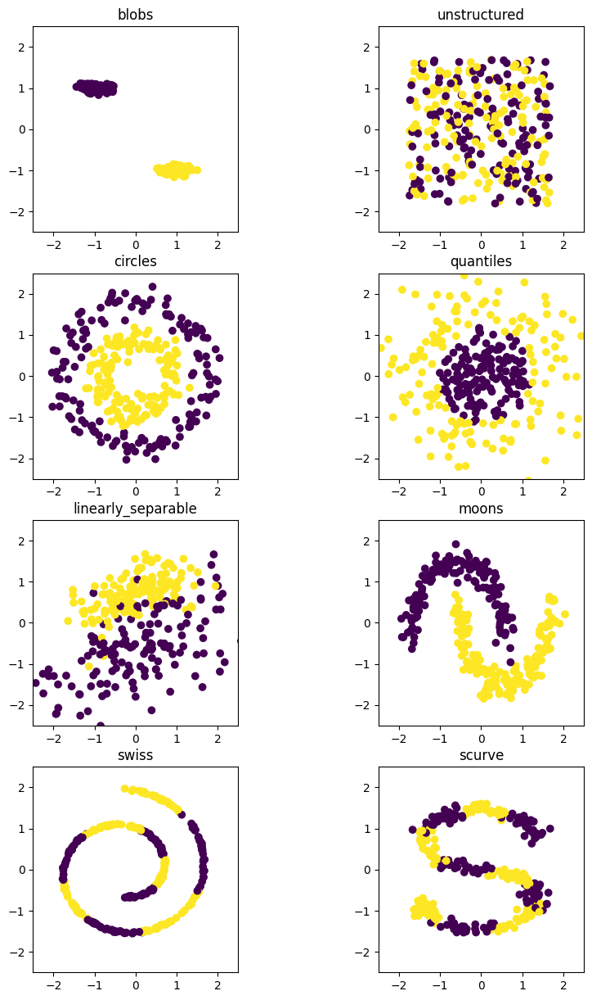

In [266]:
fig, ax = plt.subplots(4,2,figsize=(10,15))
for i, data_type in enumerate(['blobs', 'unstructured', 'circles', 'quantiles','linearly_separable','moons','swiss','scurve']):
  # Generate and visualize data blobs
  X,y = generate_dataset(data_type)
  
  ax[i//2,i%2].scatter(X[:,0],X[:,1],c=y)
  ax[i//2,i%2].set_aspect('equal')
  ax[i//2,i%2].set_xlim([-2.5,2.5])
  ax[i//2,i%2].set_ylim([-2.5,2.5])
  ax[i//2,i%2].set_title(data_type)

I anticipate that the blobs and linearly separable datasets will be easy to model with any classifier, linear or not, since both have classes that can be entirely or almost entirely separated with just a line. On the other end of the spectrum, the unstructured dataset should be the hardest to classify because there are not really any areas that contain just one class, so no decision boundaries of any shape can be drawn to include just datapoints from one class. I think that the circles and quantiles should be relatively easy to classify with a nonlinear classifier since the classes can be almost completely divided by simple circular curves. The moons may also be fairly simple to classify with a nonlinear classifier since they can likewise be separated by a single, relatively simple curve. These three may be more difficult to classify using a linear method, since the data are not clearly linearly separable in any direction. The swiss role and the s curve should be the most difficult to classify, with the 10 split sets at least, since they will require the most complex (and definitely nonlinear) decision boundaries.

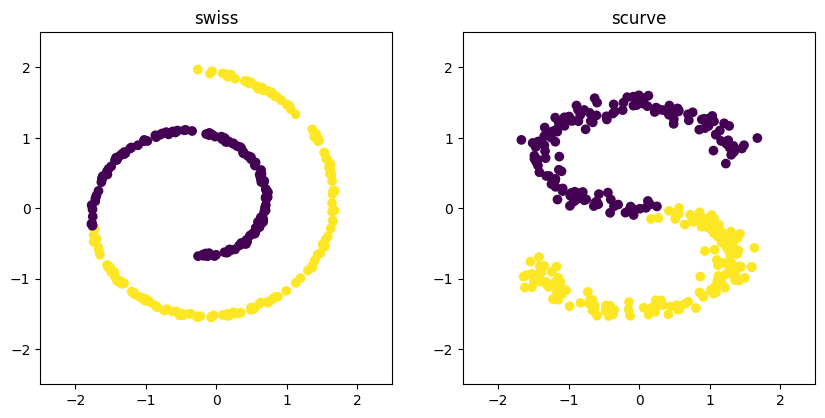

In [267]:
# Generate and visualize swiss role & scurve with 2 split sets
fig, ax = plt.subplots(1,2,figsize=(10,15))
for i, data_type in enumerate(['swiss','scurve']):
  # Generate and visualize data blobs
  X,y = generate_dataset(data_type,split=2)
  
  ax[i].scatter(X[:,0],X[:,1],c=y)
  ax[i].set_aspect('equal')
  ax[i].set_xlim([-2.5,2.5])
  ax[i].set_ylim([-2.5,2.5])
  ax[i].set_title(data_type,)

I anticipate that the 2-split S curve can be fairly classified linearly, since it appears to be almost entirely linearly separable. A nonlinear classifier should also fit fairly easily for the same reasons. The 2-split swiss role is still not terribly linearly separable, and thus will not work as well for a linear classifier. However, a nonlinear classifier should be simpler than the 10 split case, since the decision boundary can be much less complex.

### Part 1.2: SVM with nonlinear kernels

The next cell defines the function `kernel_comparison`, which you can use to visually compare the decision boundaries generated by SVMs with different kernels. 

1. The kernel comparison currently produces only visual results. Add code to the function so that it also outputs train and test accuracy of the different SVMs. (Note: Think carefully about where the right place in the code is to do a train-test split.)
2. Run the kernel comparison for the data sets from Part 1.1. Do the results confirm or contradict your expectations that you formulated in Part 1.1.? Did any of the results surprise you?
3. Consult sklearn's documentation to learn how the keyword arguments `degree` and `gamma` affect your classifier. Try out a few different values of these parameters. How and what can one infer from the shape of the decision boundary about the classifier's `degree` or `gamma`?

In [268]:
def kernel_comparison(X, y, dattype, degree=3, gamma=3, support_vectors=True, tight_box=False, if_flag=False,pflag=True):

    if (if_flag and pflag):
        fig = plt.figure(figsize=(12,9))
        #fig.suptitle(dattype)
    elif pflag:
        fig = plt.figure(figsize=(12,3))
    xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=0.1)
    
    accuracy = [0]*4

    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = SVC(kernel=kernel, degree=3, gamma=3).fit(xtrain, ytrain)

        # test model accuracy
        ypred = clf.predict(xtest)
        accuracy[ikernel] = (ypred== ytest).mean()
       # print(kernel,' kernel test accuracy for ',dattype,': ',accuracy,' d=',degree,' g=',gamma)
        if pflag:
            if if_flag:
                ax = plt.subplot(2,2,1+ikernel)
            # Settings for plotting
            else:
                ax = plt.subplot(1,4,1+ikernel)
            #x_min, x_max, y_min, y_max = -3, 3, -3, 3
             #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
            # Plot decision boundary and margins
            common_params = {"estimator": clf, "X": X, "ax": ax}
            DecisionBoundaryDisplay.from_estimator(
                **common_params,
                response_method="predict",
                plot_method="pcolormesh",
                alpha=0.3,
            )
            DecisionBoundaryDisplay.from_estimator(
                **common_params,
                response_method="decision_function",
                plot_method="contour",
                levels=[-1, 0, 1],
                colors=["k", "k", "k"],
                linestyles=["--", "-", "--"],
            )
    
            if support_vectors:
                # Plot bigger circles around samples that serve as support vectors
                ax.scatter(
                    clf.support_vectors_[:, 0],
                    clf.support_vectors_[:, 1],
                    s=200,
                    facecolors="none",
                    edgecolors="k",
                )
    
            # Plot samples by color and add legend
            ax.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolors="k")
            if (degree == 3 and gamma == 3):
                ax.set_title(dattype + " " + kernel)
            else:
                ax.set_title(dattype + " " + kernel + " d"+str(degree)+"g"+str(gamma))
            ax.axis('off')
            if if_flag:
                ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
                ax.set_ylim([X[:, 1].min(), X[:, 1].max()])
                ax.set_aspect('equal')
    print(dattype,'dataset test accuracy for each kernel type: \n')
    print('Linear:     Polynomial:       RBF:        Sigmoid:      ')
    print("{:.3f}        {:.3f}           {:.3f}        {:.3f}\n".format(accuracy[0],accuracy[1],accuracy[2],accuracy[3]))
        

blobs dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
1.000        1.000           1.000        1.000

unstructured dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.533        0.500           0.467        0.467

circles dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.467        0.633           1.000        0.467

quantiles dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.667        0.533           0.967        0.567

linearly_separable dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.967        0.867           0.967        0.667

moons dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.933        0.933           1.000        0.633

swiss dataset test accurac

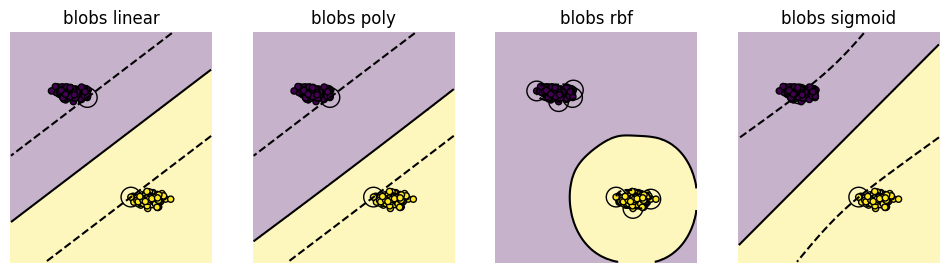

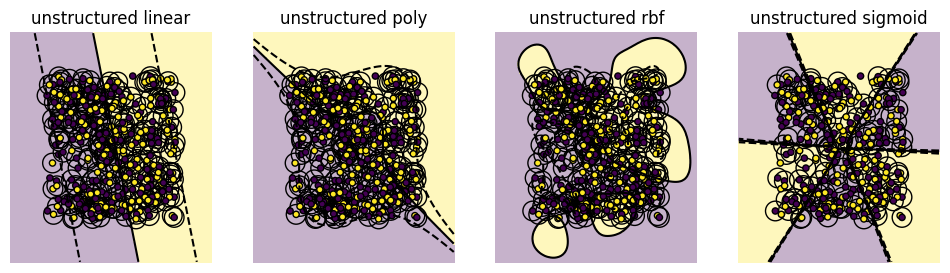

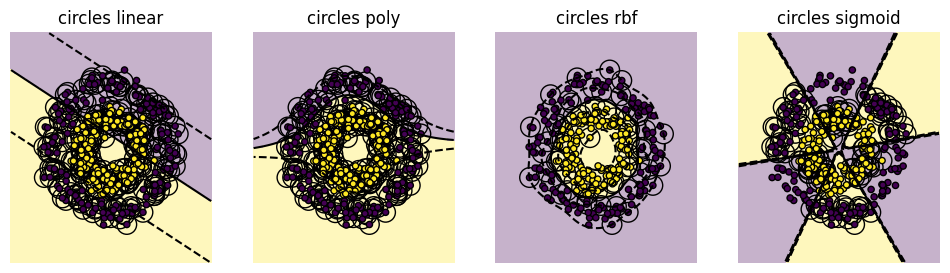

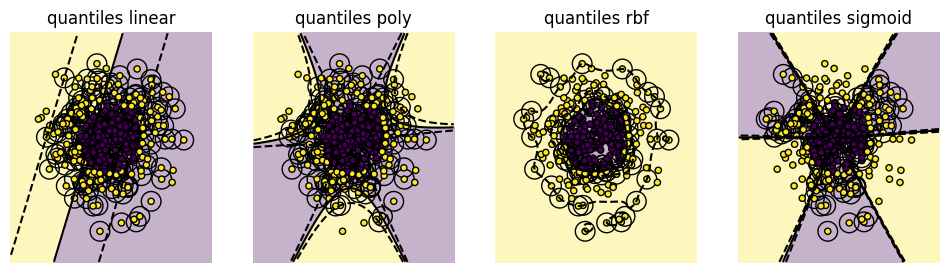

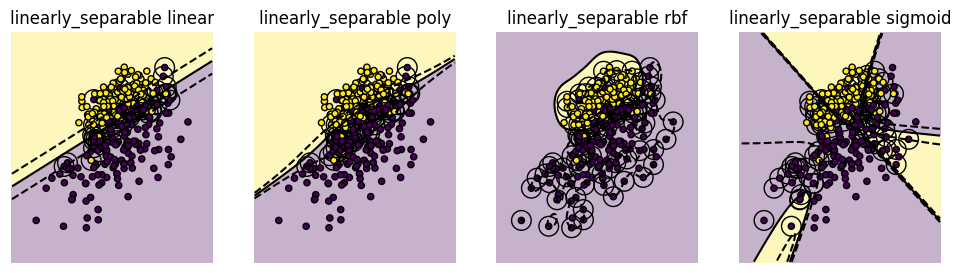

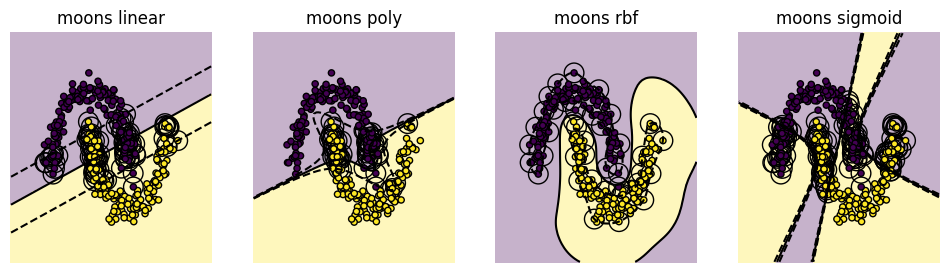

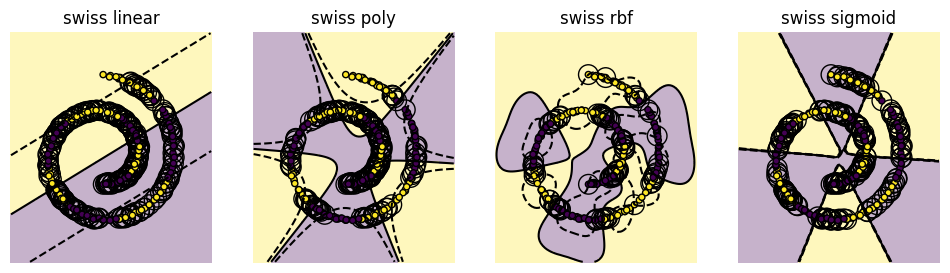

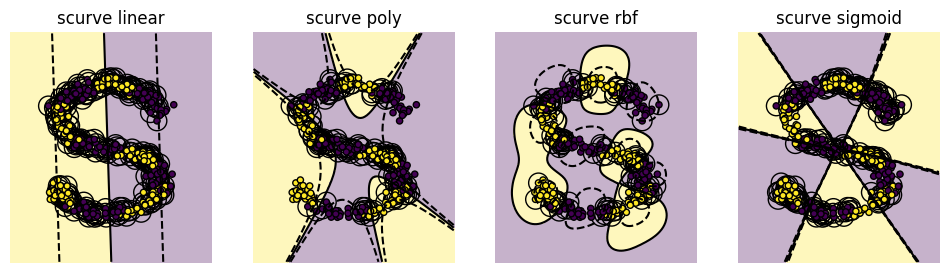

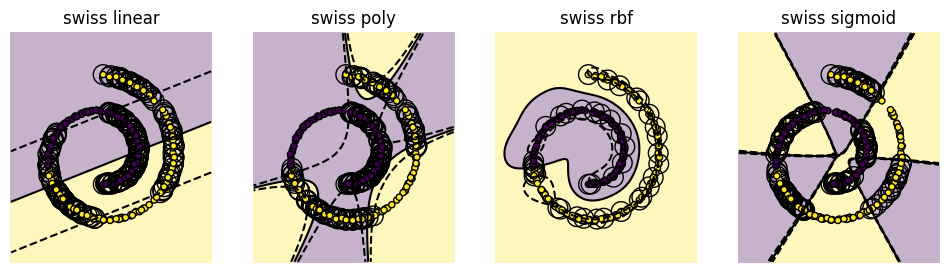

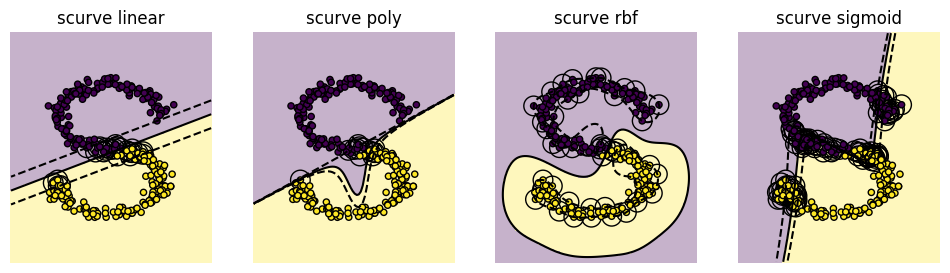

In [323]:
# Show results of kernel comparison for data sets from part 1
for i, data_type in enumerate(['blobs', 'unstructured', 'circles', 'quantiles','linearly_separable','moons','swiss','scurve']):
  # Generate and visualize data blobs
  X,y = generate_dataset(data_type)
  kernel_comparison(X,y,data_type)

for i, data_type in enumerate(['swiss','scurve']):
  # Generate and visualize data blobs
  X,y = generate_dataset(data_type,split=2)
  kernel_comparison(X,y,data_type)


To summarize the results of the kernel comparison, my expectations of which datasets would work well with linear and nonlinear classifiers. I was surprised by how well the rbf kernel worked for the swiss role and s-curve, even with the 10 split sets. 

blobs dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
1.000        1.000           1.000        1.000

blobs dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
1.000        1.000           1.000        1.000

blobs dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
1.000        1.000           1.000        1.000

unstructured dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.400        0.433           0.500        0.633

unstructured dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.400        0.400           0.533        0.600

unstructured dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.533        0.533           0.633        0.600

circles dataset test accuracy f

/var/folders/ys/9nv26n296mxdxkq7z98tt2w80000gn/T/ipykernel_53107/2030841411.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,3))


swiss dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.533        0.733           0.967        0.200

scurve dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.500        0.700           0.967        0.333

scurve dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.567        0.833           0.900        0.300

scurve dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.567        0.567           0.900        0.667



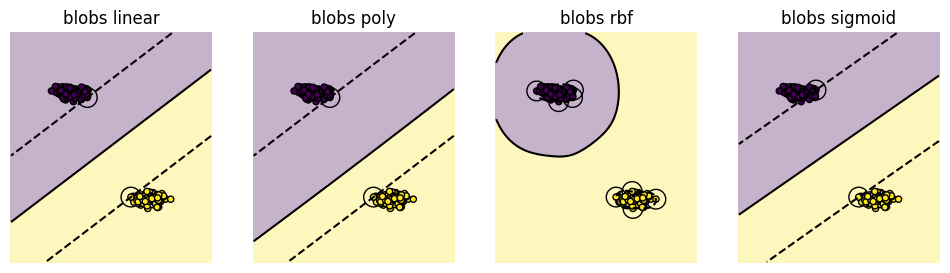

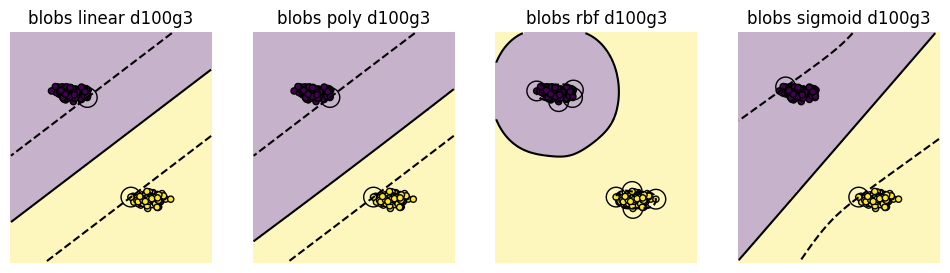

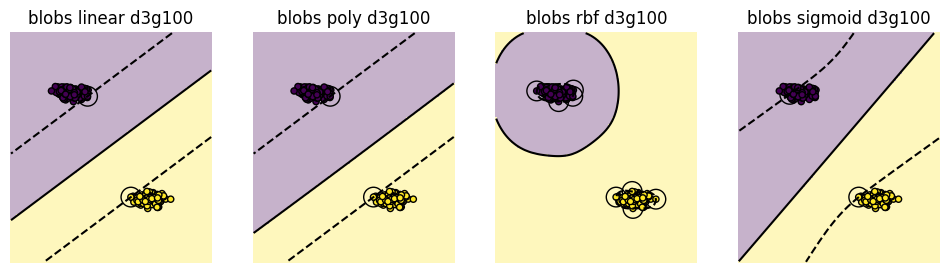

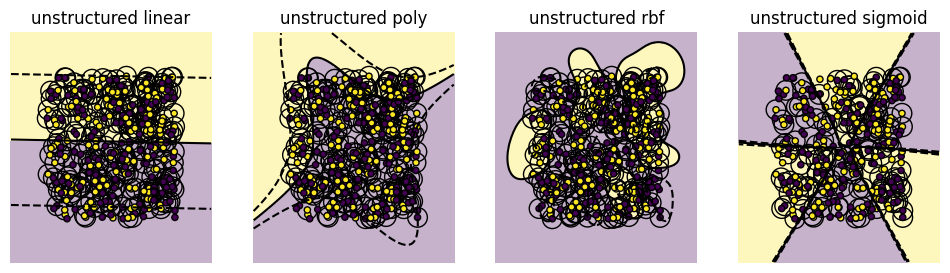

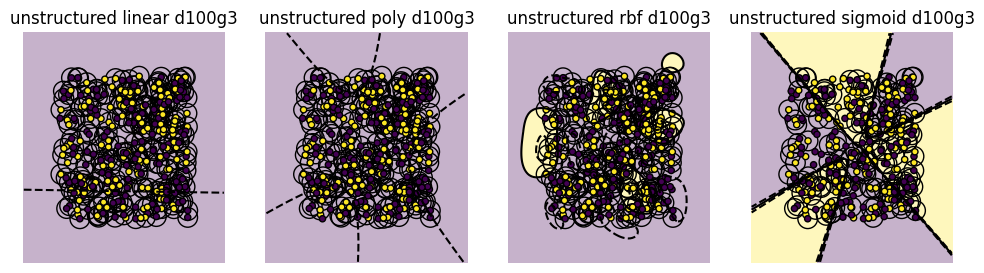

...

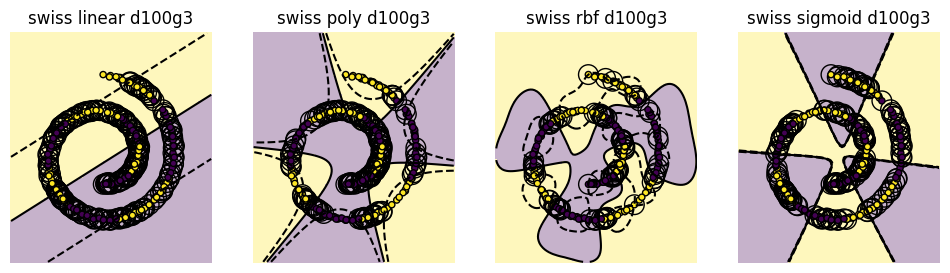

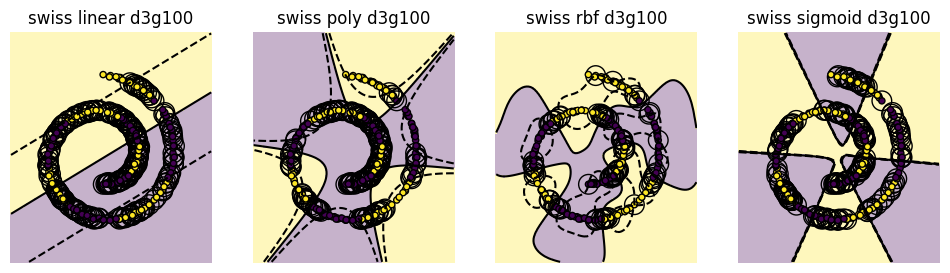

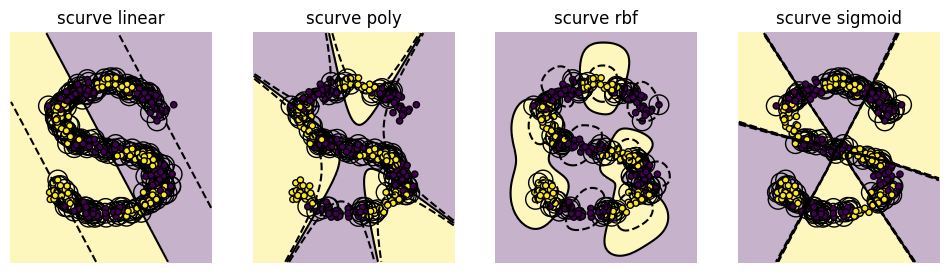

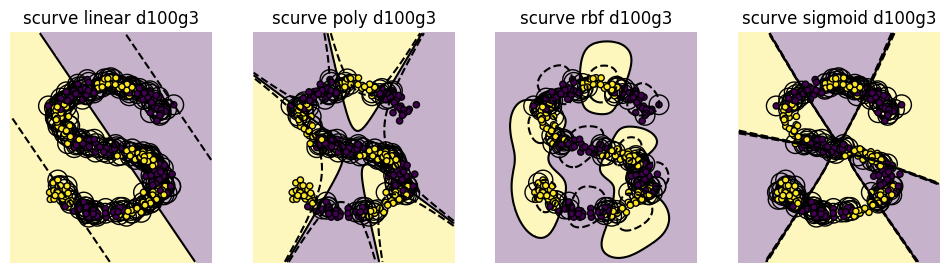

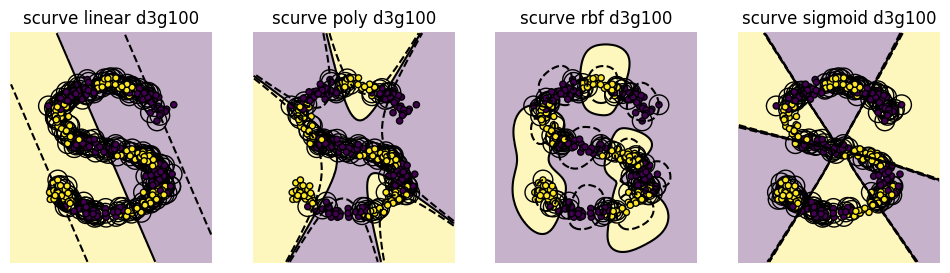

In [324]:
# Examine effect of degree and gamma keyword
# Show results of kernel comparison for data sets from part 1
for i, data_type in enumerate(['blobs', 'unstructured', 'circles', 'quantiles','linearly_separable','moons','swiss','scurve']):
  # Generate and visualize data blobs
  X,y = generate_dataset(data_type)
  kernel_comparison(X,y,data_type)
  kernel_comparison(X,y,data_type,degree=100,gamma=3)
  kernel_comparison(X,y,data_type,degree=3,gamma=100)

According to the sklearn documentation, the degree argument determines the order of the polynomial kernel, while the gamma argument determines the amount of influence each training data point has on the decision boundary (acts as a penalty). Gamma serves a similar function for the RBF and sigmoid kernels

The `degree` argument affects polynomial kernels, and its effects are most apparent for the unstructured, swiss role and s curve datasets. It changes the model by determining the order of the polynomial kernel. This affects the model's bias-variance tradeoff by increasing the variance and decreasing bias as the degree increases. 

As one increases the `degree`, the decision boundary becomes more complex. 

The `gamma` argument affects polynomial, rbf and sigmoid kernels, and is most apparent (to me) in the circles and quantiles data sets. It changes the model by adjusting the margins of the decision boundary. This affects the model's bias-variance tradeoff by more heavily penalizing classes in the margins/on the wrong side of the boundary, decreasing bias and therefore increasing variance. 

As one increases `gamma`, the decision boundary may become more complex. 


## Part 2: US Flags

### Part 2.1: Load and explore flags data
The function `load_images` loads the image data from the flags folder and turns each image into a binary (i.e., black and white) array.

1. Load the flags data.
2. Display four flags of your choice in a figure. Use the `matplotlib` commands `subplot` and `imshow` to create a figure with 2x2 flags. Consult the `matplotlib` documentation to find a way set the aspect ratio of your displayed flags to match their original aspect ratio. Update your code accordingly.

In [271]:
def load_images(folder):
    images = []
    labels = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img)//(256/2) # Convert to BW
            images.append(img)
            labels.append(filename.split('.')[0])  # Extract the state code as label
    return images, labels

/Users/hannahchipman/Documents/HannahChipman/CollegeDocs/MathAI/.venv/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


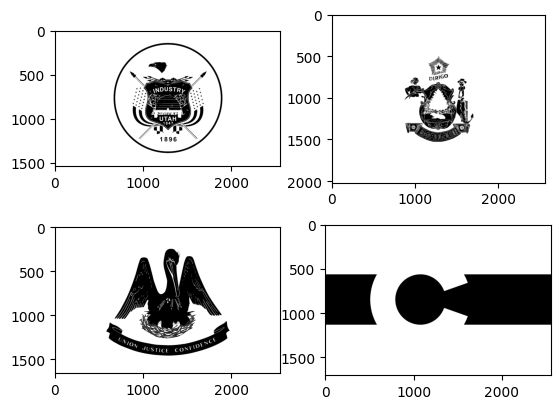

In [272]:
# Display four black-and-white flags in a 2x2 grid
images, labels = load_images('flags')
for i in range(4):
    plt.subplot(2,2,1+i)
    plt.imshow(images[i],cmap='binary',aspect='equal')

### Part 2.2: SVMs for flag pixel data
The function `sample_pixels` samples a pixel from a given image uniformly at random. 

1. Use the `sample_pixels`  function to generate synthetic data sets of pixels from for a flag image.
2. Update the `kernel_comparison` function so that if `if_flag` is `True` the decision boundaries are plotted in a 2x2 grid of subplots with plot ranges matching the height and width of the flags.
3. Show the results of the kernel comparison for the four flags that your previously selected. Use the highest values of `degree` and `gamma` that still run *reasonably fast* on your laptop.
4. Adjust your code so that you can run the quantitative part (i.e., the calculation of train and test accuracy) without plotting the decision boundaries. Run the adjusted code on all flags to indentify for each kernel the flags that yield to best easiest-to-classify and hardest-to-classify data sets. Test how the number of of pixels sampled affects your results.

In [303]:
def sample_pixels(image, num_samples=5000):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1/width-0.5, x2/width-0.5])
        pixel_labels.append(image[x2,x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

Flag 0 dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.905        0.905           0.905        0.870

Flag 1 dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.935        0.935           0.935        0.930

Flag 2 dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.815        0.815           0.875        0.710

Flag 3 dataset test accuracy for each kernel type: 

Linear:     Polynomial:       RBF:        Sigmoid:      
0.755        0.775           0.930        0.545



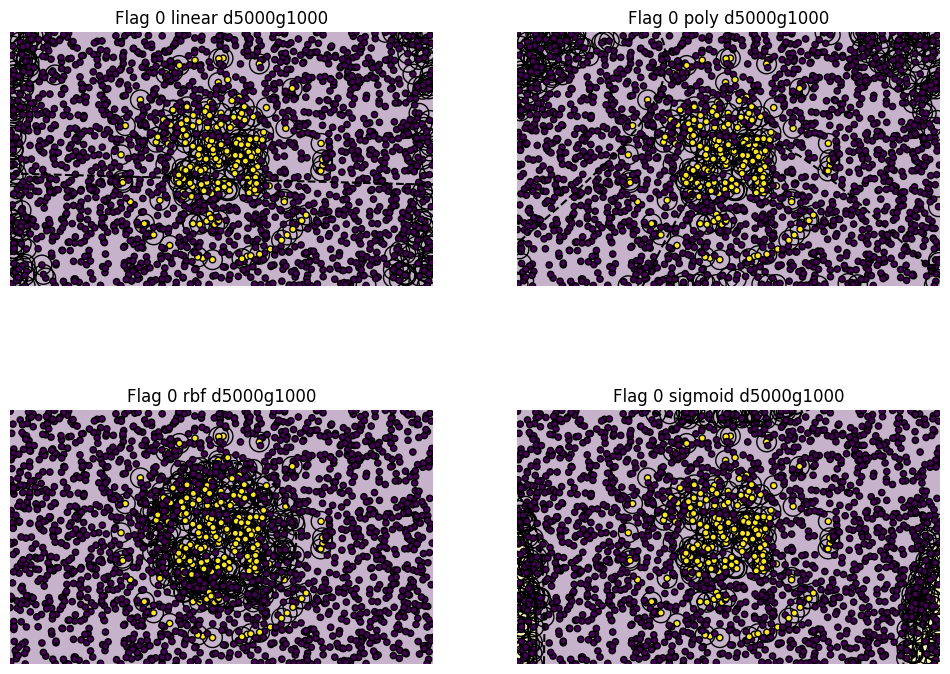

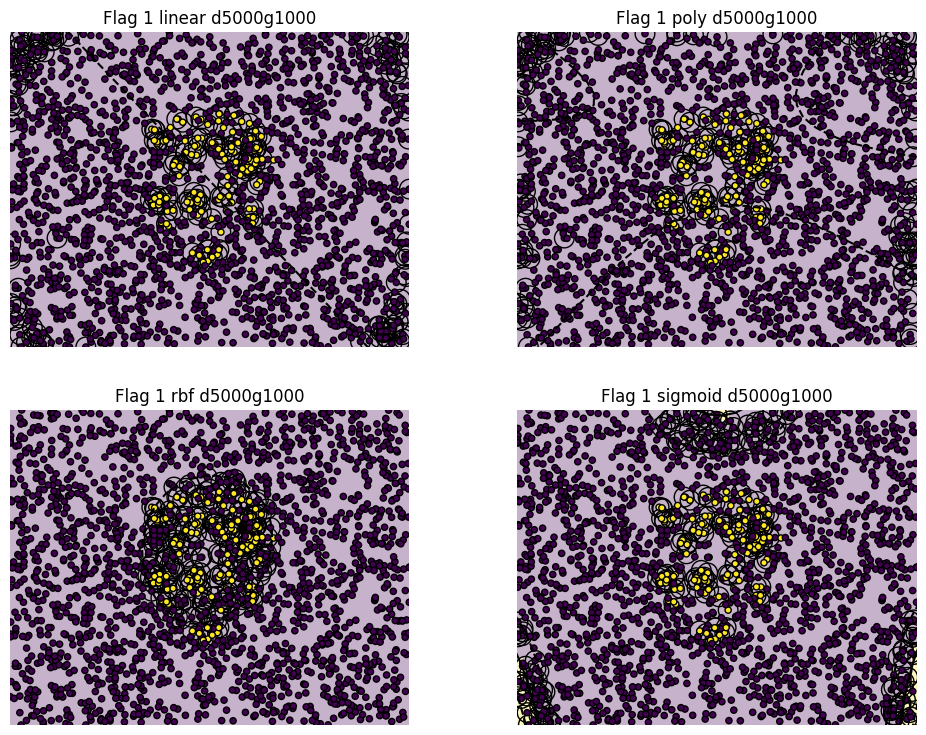

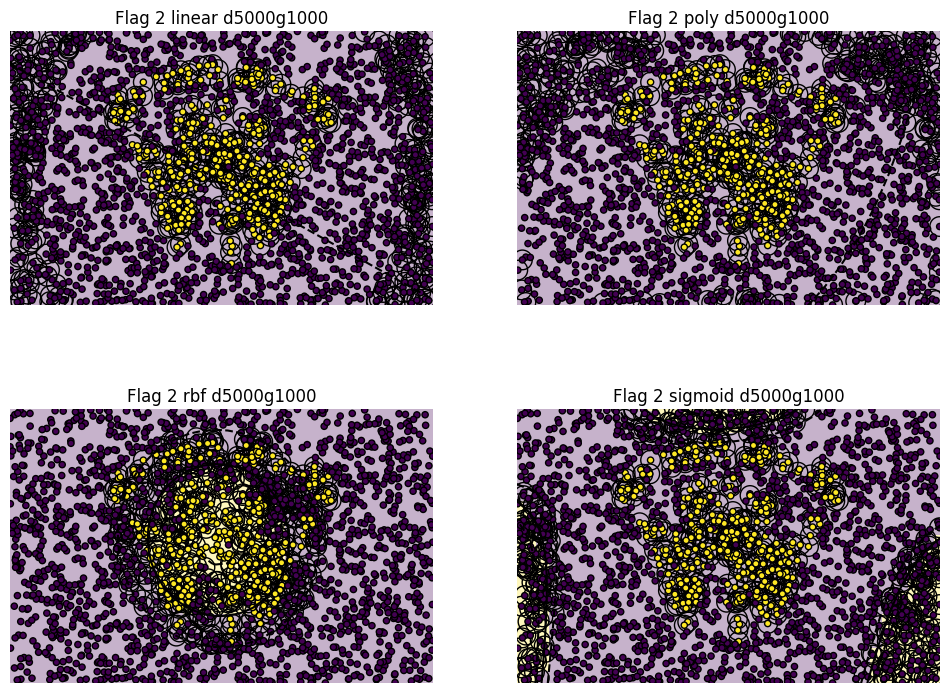

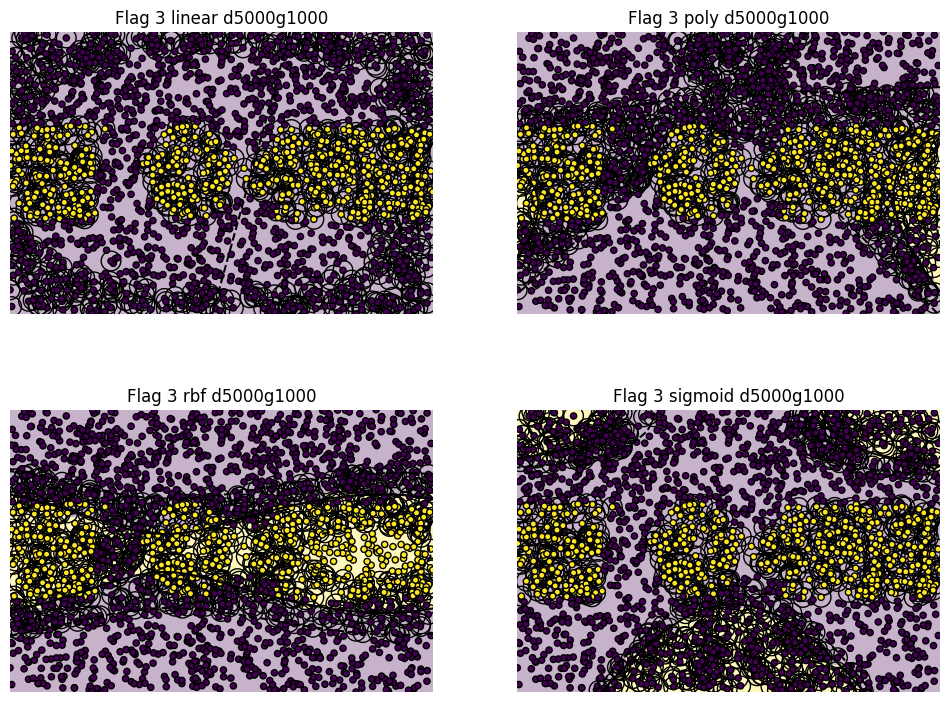

In [274]:
# Visual kernel comparison for selected flags
for i in range(4):
  # Generate and visualize data blobs
  X,y = sample_pixels(images[i])
  kernel_comparison(X,y,'Flag '+str(i),if_flag=True,degree=5000,gamma=1000)

In [308]:
def plotless_kernel_comparison(X, y, dattype, degree=3, gamma=3, support_vectors=True, tight_box=False, if_flag=False):

    xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=0.1)
    
    accuracy = [0]*4

    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = SVC(kernel=kernel, degree=3, gamma=3).fit(xtrain, ytrain)

        # test model accuracy
        ypred = clf.predict(xtest)
        accuracy[ikernel] = (ypred== ytest).mean()
       # print(kernel,' kernel test accuracy for ',dattype,': ',accuracy,' d=',degree,' g=',gamma)
    #print(dattype,'dataset test accuracy for each kernel type: \n')
    
    print("{}. {}          {:.3f}       {:.3f}             {:.3f}       {:.3f}".format(i,labels[i],accuracy[0],accuracy[1],accuracy[2],accuracy[3]))
    return np.array(accuracy)
        

Flag:         Linear:     Polynomial:       RBF:        Sigmoid:      
0. ut          0.912       0.912             0.912       0.868
1. me          0.928       0.928             0.928       0.908
2. la          0.824       0.824             0.840       0.662
3. co          0.764       0.790             0.916       0.564
4. nh          0.856       0.856             0.856       0.726
5. ms          0.874       0.874             0.874       0.782
6. md          0.514       0.546             0.620       0.458
7. nj          0.922       0.922             0.928       0.842
8. ar          0.804       0.804             0.940       0.642
9. wi          0.902       0.902             0.902       0.836
10. ok          0.936       0.936             0.936       0.886
11. mt          0.842       0.842             0.902       0.684
12. ny          0.898       0.898             0.898       0.818
13. wy          0.814       0.814             0.814       0.712
14. oh          0.782       0.782          

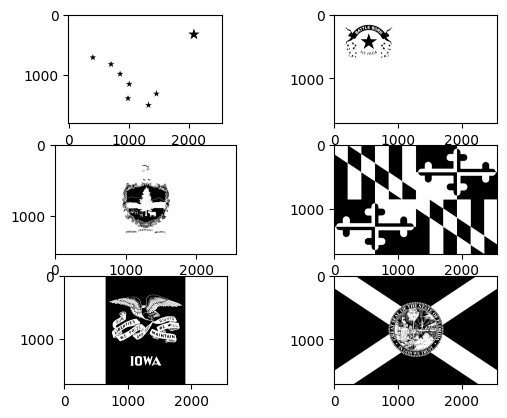

In [309]:
# Non-visual kernel comparison for all flags
accuracies = np.array([[0.000]*4]*50)
best3 = np.array([[0.000]*8]*3)
worst3 = np.array([[1.000]*8]*3) # accuracies then indices
print('Flag:         Linear:     Polynomial:       RBF:        Sigmoid:      ')
for i in range(50):
  # Generate and visualize data blobs
  X,y = sample_pixels(images[i])
  accuracies[i,:]=plotless_kernel_comparison(X,y,'Flag '+str(i),if_flag=True,degree=10000,gamma=10000)
  for j in range(4):
    if accuracies[i,j] > best3[0,j]:
      best3[0,j] = accuracies[i,j]
      best3[0,j+4] = i
    elif accuracies[i,j] > best3[1,j]:
      best3[1,j] = accuracies[i,j]
      best3[1,j+4] = i
    elif accuracies[i,j] > best3[2,j]:
      best3[2,j] = accuracies[i,j]
      best3[2,j+4] = i
    if accuracies[i,j] < worst3[0,j]:
      worst3[0,j] = accuracies[i,j]
      worst3[0,j+4] = i
    elif accuracies[i,j] < worst3[1,j]:
      worst3[1,j] = accuracies[i,j]
      worst3[1,j+4] = i
    elif accuracies[i,j] < worst3[2,j]:
      worst3[2,j] = accuracies[i,j]
      worst3[2,j+4] = i



# Display 3 best black-and-white flags in a 2x2 grid
print("\nBest 3:")
for i, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
  print("{}: {}, {}, {}".format(kernel,labels[int(best3[0,i+4])],labels[int(best3[1,i+4])],labels[int(best3[2,i+4])]))
for i in range(3):
    plt.subplot(3,2,1+i)
    plt.imshow(images[int(best3[i,4])],cmap='Grays',aspect='equal')


# Display 3 worst black-and-white flags in a 2x2 grid
print('\nWorst 3: ')
for i, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
  print("{}: {}, {}, {}".format(kernel,labels[int(worst3[0,i+4])],labels[int(worst3[1,i+4])],labels[int(worst3[2,i+4])]))
for i in range(3):
    plt.subplot(3,2,4+i)
    plt.imshow(images[int(worst3[i,4])],cmap='Grays',aspect='equal')



For these experiments, I set `num_samples` to 5000 because the results of the experiments seem to be the most stable for this number (or larger) of sampled pixels. Note that they are not still entirely stable, there seem to be a group of about six states that rotate in and out of the best 3 spots, and six that rotate through the worst. Alaska appears to always be the best though, and maryland nearly always the worst.

The linear kernel performed best (i.e., highest test accuracy) on the flags of the following three states: 

ak, nv, vt

It performed worst on the flags of the following three states: 

md, fl, al

The polynomial kernel performed best on the flags of the following three states: 

ak, nv, vt

It performed worst on the flags of the following three states: 

md, fl, al

The radial-basis function kernel performed best on the flags of the following three states: 

ak, nv, vt

It performed worst on the flags of the following three states: 

md, hi, fl

The sigmoid kernel performed best on the flags of the following three states: 

ak, nv, tn

It performed worst on the flags of the following three states:

ia, al, mo

### Part 2.3: Comparison to decision trees
Decision trees and SVMs yield substantially different decision boundaries.

1. An arbitrarily complex decision tree would be able to achieve perfect training accuracy on any data set. Explain why.
2. For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy as well. Explain why.
3. Select four flags for which you anticipate a *simple* decision tree to outperform all your SVMs. Write code that fits a decision tree to a flag pixel data set. Use your code to check your hypothesis. 

An arbitrarily complex decision tree would be able to achieve perfect training accuracy on any data set, because it can match every flag pixel for pixel with at least one leaf per pixel.

For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy because leaves can contain the values of just a few pixels, and no flag from different states matches the others to within a few pixels.

A simple decision tree is likely to perform well on the sampled pixel data of the flags of North Carolina (37), Texas (34) (inverted horizontal stripes), Alaska (47), and New Mexico (16) (basically all light, and basically all dark).

In [313]:
from sklearn.tree import DecisionTreeClassifier

nm test accuracy: 0.940
tx test accuracy: 0.962
nc test accuracy: 0.939
ak test accuracy: 0.994


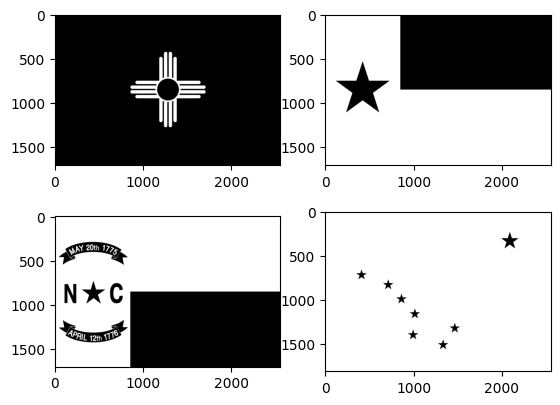

In [322]:
# Comparison of SVM and decision tree performance on sampled pixel data for four flags
for i,states in enumerate([16,34,37,47]):
    plt.subplot(2,2,1+i)
    plt.imshow(images[states],cmap='binary',aspect='equal')

    X,y = sample_pixels(images[i])
    xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=0.25)
    dtc1 = DecisionTreeClassifier(max_leaf_nodes=50).fit(xtrain,ytrain)
    ypred = dtc1.predict(xtest)
    acc = (ypred== ytest).mean()
    print("{} test accuracy: {:.3f}".format(labels[states],acc))
    


The decision tree classifier achieves comparable or higher test accuracy for a selection of pixels that is 100 times smaller. Thus, for flags that are contrasting, a decision tree is a much more efficient way to classify them.